# 06. Model selection

### 1. Implement a linear model

* return the weight parameters w = (w1, w2, ... , wP) and the intercept parameter w0 separately where:


$$ \hat{y}(\vec{w}, \vec{x}) = w_0 + w_1 x_1 + ... + w_p x_p$$


* check your returned coefficients with the built in `LinearRegression` class from the `sklearn` library, they should be within tolerance `1e-6`to each other


* use a generated regression dataset `from sklearn.dataset import make_regression` API with parameters `n_samples=1000` and `n_features=20`

### 2. Use of real data

* download the [Communities and Crime Data Set](https://archive.ics.uci.edu/ml/datasets/Communities+and+Crime) from UCI, the task includes understanding the dataset: naming the appropiate data fields, handling missing values, etc.
    
* fit a `LinearRegression` model with 5-fold cross-validation - compare training and testing scores (R^2 by default) for the different CV splits, print the mean score and its standard deviation

* find the best `Lasso` regression model with 5-fold grid search cross validation (`GridSearchCV`) on the parameters: `alpha, normalize, max_iter` and show the best parameter set


### 3. Shrinkage

* interpret Lasso model's findings based on its descriptive parameters by the shrinkage method described during the lecture (make a plot and check the names of the features that are not eliminated by the penalty parameter) on the data we have here (this is an explanatory data analysis problem, be to be creative)

* fit Ridge model and apply the shrinkage method as well, did you get what you expect?

* do you think normalization is needed here? If so, do not forget!

### 4. Subset selection

* Split the data to a training and test set and do recursive feature elimination until 10 remaining predictors with 5-fold cross-validated regressors (`RidgeCV`, `LassoCV`, `ElasticNetCV`) on the training set, plot their names and look up some of their meanings (recursive feature elimination is part of `sklearn` but you can do it with a for loop if you whish).

* Do all models provide the same descriptors? Check their performance on the test set! Plot all model predictions compared to the `y_test` on 3 different plots, which model seems to be the best?

### 5. ElasticNet penalty surface

* visualize the surface of the $ objective(\alpha, \beta) $ parameters corresponding to the L1 and L2 regularizations. Select the best possible combination of the hyper-parameters that minimize the objective (clue: `from scipy.optimize import minimize`)
    * this task is similar to what you've seen during class, just not for MSE vs. single penalty parameter but MSE vs. two penalty parameters $\alpha, \beta$

* interpret the findings! do you think linear models are powerful enough on this dataset?

### Hints:
 - On total you can get 10 points for fully completing all tasks.
 - Decorate your notebook with, questions, explanation etc, make it self contained and understandable!
 - Comments you code when necessary
 - Write functions for repetitive tasks!
 - Use the pandas package for data loading and handling
 - Use matplotlib and seaborn for plotting or bokeh and plotly for interactive investigation
 - Use the scikit learn package for almost everything
 - Use for loops only if it is really necessary!
 - Code sharing is not allowed between student! Sharing code will result in zero points.
 - If you use code found on web, it is OK, but, make its source clear! 

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
sns.set()
import pandas as pd

# Task 1

In [2]:
# defining linear regression using the normal equation
def myLin_reg(x, y):
    
    x = np.array(x)
    y = np.array(y)
    
    w = (np.linalg.inv((np.transpose(x) @ x)) @ np.transpose(x)) @ y
    
    return w

In [3]:
from sklearn.datasets import make_regression
from sklearn.linear_model import LinearRegression

In [4]:
# generating the regression data
lin_reg = LinearRegression()
X, y = make_regression(n_samples=1000, n_features=20)

In [5]:
# predicting the coefficients using my linear regression
myCoeffs = myLin_reg(X, y)

In [6]:
# predicting the coefficients using sklearn's linear regression
coeffs = lin_reg.fit(X, y).coef_

In [7]:
myCoeffs

array([ 0.00000000e+00,  6.88698166e+00, -9.76996262e-15, -3.10862447e-15,
        2.70763066e+01,  3.54579262e+01,  5.83099781e+01,  9.12205238e+01,
        1.20897369e+01,  1.33226763e-15,  9.76996262e-15,  1.19904087e-14,
        1.76902160e+01, -1.33226763e-15,  9.44700802e+01, -1.77635684e-15,
       -1.33226763e-15,  5.90710734e+01, -6.93889390e-15,  6.28517996e+00])

In [8]:
coeffs

array([ 8.07525899e-14,  6.88698166e+00, -3.90798505e-14,  1.35447209e-14,
        2.70763066e+01,  3.54579262e+01,  5.83099781e+01,  9.12205238e+01,
        1.20897369e+01,  4.79616347e-14, -2.13162821e-14, -3.19744231e-14,
        1.76902160e+01,  1.59872116e-14,  9.44700802e+01, -1.77635684e-14,
        1.95399252e-14,  5.90710734e+01,  5.32907052e-15,  6.28517996e+00])

Text(0, 0.5, 'Value of coefficient')

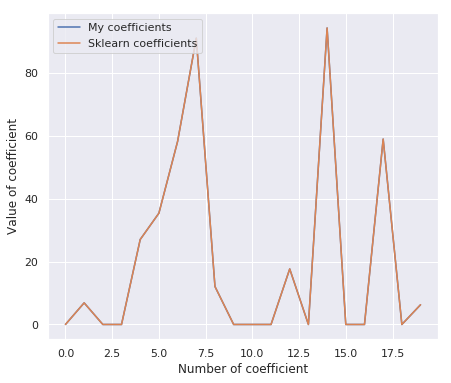

In [9]:
# plotting the coefficients predicted by the two regressions
plt.figure(figsize=(7, 6))
plt.plot(myCoeffs, label='My coefficients')
plt.plot(coeffs, label='Sklearn coefficients')
plt.legend(loc='upper left')
plt.xlabel('Number of coefficient')
plt.ylabel('Value of coefficient')

In [10]:
for i in range(len(myCoeffs)):
    if abs(myCoeffs[i]-coeffs[i]) > 1e-6:
        print('Greater than tolerance')
    else:
        print('In tolerance')

In tolerance
In tolerance
In tolerance
In tolerance
In tolerance
In tolerance
In tolerance
In tolerance
In tolerance
In tolerance
In tolerance
In tolerance
In tolerance
In tolerance
In tolerance
In tolerance
In tolerance
In tolerance
In tolerance
In tolerance


All of my coefficients are within the predefined tolerance.

# Task 2

In [11]:
df = pd.read_csv("communities.data", sep=",", header=None, na_values = '?')

In [12]:
df.head()

,0,1,2,3,4,5,6,7,8,9,...,118,119,120,121,122,123,124,125,126,127
0,8,NaN,NaN,Lakewoodcity,1,0.19,0.33,0.02,0.90,0.12,...,0.12,0.26,0.20,0.06,0.04,0.9,0.5,0.32,0.14,0.20
1,53,NaN,NaN,Tukwilacity,1,0.00,0.16,0.12,0.74,0.45,...,0.02,0.12,0.45,NaN,NaN,NaN,NaN,0.00,NaN,0.67
2,24,NaN,NaN,Aberdeentown,1,0.00,0.42,0.49,0.56,0.17,...,0.01,0.21,0.02,NaN,NaN,NaN,NaN,0.00,NaN,0.43
3,34,5.0,81440.0,Willingborotownship,1,0.04,0.77,1.00,0.08,0.12,...,0.02,0.39,0.28,NaN,NaN,NaN,NaN,0.00,NaN,0.12
4,42,95.0,6096.0,Bethlehemtownship,1,0.01,0.55,0.02,0.95,0.09,...,0.04,0.09,0.02,NaN,NaN,NaN,NaN,0.00,NaN,0.03


In [13]:
rows_to_keep = [i for i in range(75, 204)]
attributes = pd.read_csv("communities.names", sep=" ", header=None, skiprows = lambda x: x not in rows_to_keep)

In [14]:
df.columns = list(attributes[1])

In [15]:
# dropping non-predicitve columns
df.drop(['state', 'county', 'community', 'communityname', 'fold', ], axis=1, inplace=True)

In [16]:
df.head()

,population,householdsize,racepctblack,racePctWhite,racePctAsian,racePctHisp,agePct12t21,agePct12t29,agePct16t24,agePct65up,...,LandArea,PopDens,PctUsePubTrans,PolicCars,PolicOperBudg,LemasPctPolicOnPatr,LemasGangUnitDeploy,LemasPctOfficDrugUn,PolicBudgPerPop,ViolentCrimesPerPop
0,0.19,0.33,0.02,0.90,0.12,0.17,0.34,0.47,0.29,0.32,...,0.12,0.26,0.20,0.06,0.04,0.9,0.5,0.32,0.14,0.20
1,0.00,0.16,0.12,0.74,0.45,0.07,0.26,0.59,0.35,0.27,...,0.02,0.12,0.45,NaN,NaN,NaN,NaN,0.00,NaN,0.67
2,0.00,0.42,0.49,0.56,0.17,0.04,0.39,0.47,0.28,0.32,...,0.01,0.21,0.02,NaN,NaN,NaN,NaN,0.00,NaN,0.43
3,0.04,0.77,1.00,0.08,0.12,0.10,0.51,0.50,0.34,0.21,...,0.02,0.39,0.28,NaN,NaN,NaN,NaN,0.00,NaN,0.12
4,0.01,0.55,0.02,0.95,0.09,0.05,0.38,0.38,0.23,0.36,...,0.04,0.09,0.02,NaN,NaN,NaN,NaN,0.00,NaN,0.03


In [17]:
df.shape

(1994, 123)

In [18]:
df.isna().sum()

population                 0
householdsize              0
racepctblack               0
racePctWhite               0
racePctAsian               0
racePctHisp                0
agePct12t21                0
agePct12t29                0
agePct16t24                0
agePct65up                 0
numbUrban                  0
pctUrban                   0
medIncome                  0
pctWWage                   0
pctWFarmSelf               0
pctWInvInc                 0
pctWSocSec                 0
pctWPubAsst                0
pctWRetire                 0
medFamInc                  0
perCapInc                  0
whitePerCap                0
blackPerCap                0
indianPerCap               0
AsianPerCap                0
OtherPerCap                1
HispPerCap                 0
NumUnderPov                0
PctPopUnderPov             0
PctLess9thGrade            0
                        ... 
PctSameHouse85             0
PctSameCity85              0
PctSameState85             0
LemasSwornFT  

In [19]:
List = list(df.columns[df.isna().sum() > 1000])

In [20]:
# dropping columns with more than 1000 missing values
df.drop(List, axis=1, inplace=True)

In [21]:
df.columns[df.isna().sum() > 0]

Index(['OtherPerCap'], dtype='object')

In [22]:
# filling remaining missing values with columnwise mean
df.fillna(df.mean(), inplace=True)

In [23]:
df.head()

,population,householdsize,racepctblack,racePctWhite,racePctAsian,racePctHisp,agePct12t21,agePct12t29,agePct16t24,agePct65up,...,PctForeignBorn,PctBornSameState,PctSameHouse85,PctSameCity85,PctSameState85,LandArea,PopDens,PctUsePubTrans,LemasPctOfficDrugUn,ViolentCrimesPerPop
0,0.19,0.33,0.02,0.90,0.12,0.17,0.34,0.47,0.29,0.32,...,0.12,0.42,0.50,0.51,0.64,0.12,0.26,0.20,0.32,0.20
1,0.00,0.16,0.12,0.74,0.45,0.07,0.26,0.59,0.35,0.27,...,0.21,0.50,0.34,0.60,0.52,0.02,0.12,0.45,0.00,0.67
2,0.00,0.42,0.49,0.56,0.17,0.04,0.39,0.47,0.28,0.32,...,0.14,0.49,0.54,0.67,0.56,0.01,0.21,0.02,0.00,0.43
3,0.04,0.77,1.00,0.08,0.12,0.10,0.51,0.50,0.34,0.21,...,0.19,0.30,0.73,0.64,0.65,0.02,0.39,0.28,0.00,0.12
4,0.01,0.55,0.02,0.95,0.09,0.05,0.38,0.38,0.23,0.36,...,0.11,0.72,0.64,0.61,0.53,0.04,0.09,0.02,0.00,0.03


In [24]:
df = df.apply(pd.to_numeric)

In [25]:
X2 = np.array(df.drop(['ViolentCrimesPerPop'], axis=1))
y2 = np.array(df['ViolentCrimesPerPop'])

In [26]:
# splittin train and test data
from sklearn.model_selection import train_test_split


X_train, X_test, y_train, y_test = train_test_split(X2, y2, test_size=0.3, random_state=42)

In [27]:
# 5 fold cross validating
from sklearn.model_selection import cross_val_score

lr2 = LinearRegression()
train_score = cross_val_score(lr2, X_train, y_train, cv=5, scoring='r2')
test_score = cross_val_score(lr2, X_test, y_test, cv=5, scoring='r2')

In [28]:
print('Train mean:', train_score.mean(), 'and it\'s standard deviation:', train_score.std())

Train mean: 0.6427467577506858 and it's standard deviation: 0.025456053292506935


In [29]:
print('Test mean:', test_score.mean(), 'and it\'s standard deviation:', test_score.std())

Test mean: 0.5794411997340606 and it's standard deviation: 0.05468664929281959


Train and test means are pretty close, this shouldn't surprise us since they are from the same dataset and we assume there wasn't any significant change in them while splitting. The same is true for the standard deviations.

In [30]:
train_score

array([0.67900116, 0.61190662, 0.66395292, 0.63867051, 0.62020258])

In [31]:
test_score

array([0.58719798, 0.61302748, 0.5363179 , 0.65747968, 0.50318296])

In [32]:
# performing gridsearch on the Lasso model
from sklearn.model_selection import GridSearchCV
from sklearn.linear_model import Lasso

parameters= {'alpha':[0.005, 0.01, 0.02, 0.024, 0.025, 0.026, 0.03], 'normalize':(True, False),
                                               'max_iter':[900, 1000, 1100, 1200, 1300]}

best_params = GridSearchCV(Lasso(), parameters, cv=5).fit(X2, y2).best_params_

In [33]:
best_params

{'alpha': 0.005, 'max_iter': 900, 'normalize': False}

# Task 3

In [34]:
lasso3 = Lasso(normalize=False)
coeffs3 = []
tuning_params =  np.linspace(0.0001, 0.03, 300)

for i in range(len(tuning_params)):
    lasso3.set_params(alpha = tuning_params[i])
    lasso3.fit(X2, y2)
    coeffs3.append(lasso3.coef_)

In [35]:
coeff_df = pd.DataFrame(coeffs3)
coeff_df.columns = df.columns[:100]

In [36]:
import plotly.graph_objects as go

fig = go.Figure()

for i in coeff_df.columns:
    fig.add_trace(
        go.Scatter(
            x=tuning_params,
            y=coeff_df[f'{i}'],
            mode="lines",
            line=go.scatter.Line(),
            name=i,
            showlegend=False))
    
fig.update_xaxes(title_text='Alpha')
fig.update_yaxes(title_text='Coefficients')
fig.update_layout( title={'text': 'Shrinkage of Lasso without normalization'})

After alpha=0.02 the only coefficients which are not eliminated are:<br>
- PctKids2Par: percentage of kids in family housing with two parents
- racePctWhite: percentage of population that is caucasian
- PctIlleg: percentage of kids born to never married

In [37]:
nlasso3 = Lasso(normalize=True)
ncoeffs3 = []
ntuning_params =  np.linspace(0.0001, 0.03, 300)

for i in range(len(ntuning_params)):
    nlasso3.set_params(alpha = ntuning_params[i])
    nlasso3.fit(X2, y2)
    ncoeffs3.append(nlasso3.coef_)

In [38]:
ncoeff_df = pd.DataFrame(ncoeffs3)
ncoeff_df.columns = df.columns[:100]

In [39]:
fig2 = go.Figure()

for i in ncoeff_df.columns:
    fig2.add_trace(
        go.Scatter(
            x=ntuning_params,
            y=ncoeff_df[f'{i}'],
            mode="lines",
            line=go.scatter.Line(),
            name=i,
            showlegend=False))
    
fig2.update_xaxes(title_text='Alpha')
fig2.update_yaxes(title_text='Coefficients')
fig2.update_layout( title={'text': 'Shrinkage of Lasso with normalization'})

With normalization the coefficients reach zero at a much lower alpha, but the same ones shrink the latest as in the non-normalized shrinkage plot. Let's use the ridge regression with normalization too!

In [40]:
from sklearn.linear_model import Ridge


ridge = Ridge(normalize=True)
ridge_coeffs3 = []
ridge_tuning_params =  np.linspace(1, 50, 200)

for i in range(len(ridge_tuning_params)):
    ridge.set_params(alpha = ridge_tuning_params[i])
    ridge.fit(X2, y2)
    ridge_coeffs3.append(ridge.coef_)

In [41]:
ridge_coeff_df = pd.DataFrame(ridge_coeffs3)
ridge_coeff_df.columns = df.columns[:100]

In [42]:
fig3 = go.Figure()

for i in ncoeff_df.columns:
    fig3.add_trace(
        go.Scatter(
            x=ridge_tuning_params,
            y=ridge_coeff_df[f'{i}'],
            mode="lines",
            line=go.scatter.Line(),
            name=i,
            showlegend=False))
    
fig3.update_xaxes(title_text='Alpha')
fig3.update_yaxes(title_text='Coefficients')
fig3.update_layout( title={'text': 'Shrinkage of Ridge with normalization'})

The shrinkage plot for the Ridge regression is what I expected, all the coefficients converge to zero.

# Task 4

In [43]:
from sklearn.feature_selection import RFE
from sklearn.linear_model import RidgeCV, LassoCV, ElasticNetCV

In [44]:
# performing RFE and saving the best predictors
ridge_cv = RidgeCV(cv=5, normalize=True)
selector = RFE(ridge_cv, n_features_to_select=10, step=1)
ridge_selector = selector.fit(X_train, y_train)
ridge_features = [df.columns[i] for i in np.where(selector.ranking_ == 1)[0]]

In [45]:
lasso_cv = LassoCV(cv=5, normalize=True)
selector2 = RFE(lasso_cv, n_features_to_select=10, step=1)
lasso_selector = selector2.fit(X_train, y_train)
lasso_features = [df.columns[i] for i in np.where(selector2.ranking_ == 1)[0]]

In [46]:
elastic_cv = ElasticNetCV(cv=5, normalize=True)
selector3 = RFE(elastic_cv, n_features_to_select=10, step=1)
elastic_selector = selector3.fit(X_train, y_train)
elastic_features = [df.columns[i] for i in np.where(selector3.ranking_ == 1)[0]]

In [47]:
ridge_features == lasso_features

False

In [48]:
lasso_features == elastic_features

True

Lasso and ElasticNet provide the same predictors.

In [49]:
lasso_pred = selector.predict(X_test)
ridge_pred = selector2.predict(X_test)
elastic_pred = selector3.predict(X_test)

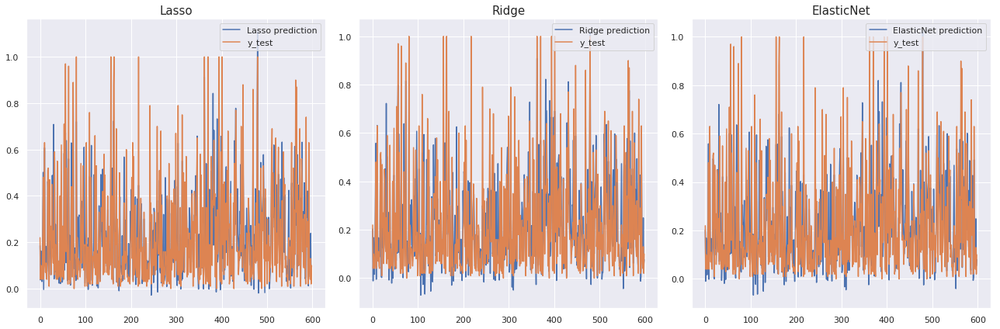

In [50]:
plt.figure(figsize=(18, 6))

plt.subplot(1, 3, 1)
plt.plot(lasso_pred, label='Lasso prediction')
plt.plot(y_test, label='y_test')
plt.legend(loc='upper right')
plt.title('Lasso', size=15)

plt.subplot(1, 3, 2)
plt.plot(ridge_pred, label='Ridge prediction')
plt.plot(y_test, label='y_test')
plt.legend(loc='upper right')
plt.title('Ridge', size=15)

plt.subplot(1, 3, 3)
plt.plot(elastic_pred, label='ElasticNet prediction')
plt.plot(y_test, label='y_test')
plt.legend(loc='upper right')
plt.title('ElasticNet', size=15)


plt.tight_layout()

The graphs are too crowded to decide which regressor might be the best, let's take a look at the R2 scores.

In [51]:
from sklearn.metrics import r2_score


lasso_r2 = r2_score(y_test, lasso_pred)
ridge_r2 = r2_score(y_test, ridge_pred)
elastic_r2 = r2_score(y_test, elastic_pred)

In [52]:
print('R2 score of Lasso:', lasso_r2)

R2 score of Lasso: 0.62664481676257


In [53]:
print('R2 score of Ridge:', ridge_r2)

R2 score of Ridge: 0.6357606180282351


In [54]:
print('R2 score of ElasticNet:', elastic_r2)

R2 score of ElasticNet: 0.6364453070730955


According to the R2 scores the ElasticNet gives the most accurate prediction.

# Task 5

In [55]:
# getting the combinations of the penalty parameters for our plot
from sklearn.linear_model import ElasticNet
from sklearn.metrics import mean_squared_error


a = np.linspace(0.001, 0.05, 100)
b = np.linspace(0.0001, 1.6, 100)

xx, yy = np.meshgrid(a, b)

mae = []

for i, j in zip(np.ravel(xx), np.ravel(yy)):
    elastic_net = ElasticNet(alpha=i+j, l1_ratio=i/(i+j)).fit(X_train, y_train)
    mae.append(np.mean(abs((y_test-elastic_net.predict(X_test)))))

mae = np.array(mae)

In [56]:
z = mae.reshape(xx.shape)

fig = go.Figure(data=[go.Surface(z=z, x=xx, y=yy)])
fig.update_layout(title='ElasticNet Penalty Surface plot', autosize=False,
                  width=700, height=700,
                  margin=dict(l=65, r=50, b=65, t=90))
fig.show()

In [57]:
# defining fuction to minimize
def elastic_mae(v):
    a = v[0]
    b = v[1]
    
    elastic_net2 = ElasticNet(alpha=a+b, l1_ratio=a/(a+b)).fit(X_train, y_train)
    mae2 = np.mean(abs((y_test-elastic_net.predict(X_test))))
    
    return mae2

In [58]:
from scipy.optimize import minimize


guess = [0.00003, 0.000001]

min = minimize(elastic_mae, guess)

In [59]:
min.x

array([3.e-05, 1.e-06])

Minimize seems to always return the initial guess, couldn't find any solution :(